In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import pandas as pd
from astropy.nddata import Cutout2D
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
from astropy.coordinates import ICRS, Galactic, FK4, FK5  # Low-level frames
from astropy.coordinates import Angle, Latitude, Longitude  # Angles
import astropy.units as u
from astropy.visualization import simple_norm
from astropy.visualization import ZScaleInterval
from scipy.ndimage import gaussian_filter
from astropy.stats import mad_std
import matplotlib.ticker as ticker
from astropy.stats import sigma_clipped_stats
# from photutils.aperture import CircularAperture
# from photutils.aperture import SkyCircularAperture
# from photutils.aperture import aperture_photometry
# import os
from astropy.table import Table
from make_cuts import choosef, random_apers, get_names, radec_minmax, cuts

#from astroML.plotting import MultiAxes

In [2]:
from matplotlib import rc                # Establece parámetros iniciales al grupo
rc('text', usetex=False)
SMALL_SIZE = 15
MEDIUM_SIZE = 20
BIGGER_SIZE = 25
plt.rc('font', family='serif')
plt.rc('font', size=SMALL_SIZE)          # Controla tamaño de texto por defecto
plt.rc('axes', titlesize=BIGGER_SIZE)    # Tamaño de las fuentes de los títulos
# Tamaño de las fuentes de los ejes x e y
plt.rc('axes', labelsize=MEDIUM_SIZE)
plt.rc('xtick', labelsize=SMALL_SIZE)    # Tamaño de los tick en el eje x
plt.rc('ytick', labelsize=SMALL_SIZE)    # Tamaño de los tick en el eje y
plt.rc('legend', fontsize=SMALL_SIZE)    # Tamaño de las leyendas
# Tamaño de la fuente del título de la figura
plt.rc('figure', titlesize=BIGGER_SIZE)

In [3]:


NSF_NB = fits.open('Fields/nsf_nb964_sci.fits')
data_NB = NSF_NB[1].data
hdr_NB = NSF_NB[1].header


In [4]:
df = Table.read('May_NSF_cat.fits')  # el error es 1 arcsec
df

NUMBER,FLUX_ISO,FLUXERR_ISO,MAG_ISO,MAGERR_ISO,FLUX_APER [13],FLUXERR_APER [13],MAGERR_APER [13],MAG_APER [13],FLUX_AUTO,FLUXERR_AUTO,MAG_AUTO,MAGERR_AUTO,BACKGROUND,ALPHAPEAK_J2000,DELTAPEAK_J2000,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,FLAGS,ELONGATION,ELLIPTICITY,CLASS_STAR,FLUX_RADIUS,SNR_WIN,MAG_APER_g [13],FLUX_APER_g [13],FLUXERR_APER_g [13],MAGERR_APER_g [13],MAGERR_AUTO_g,BACKGROUND_g,MAG_AUTO_g,MAG_APER_r [13],FLUX_APER_r [13],FLUXERR_APER_r [13],MAGERR_APER_r [13],MAGERR_AUTO_r,BACKGROUND_r,MAG_AUTO_r,MAG_APER_i [13],FLUX_APER_i [13],FLUXERR_APER_i [13],MAGERR_APER_i [13],MAGERR_AUTO_i,BACKGROUND_i,MAG_AUTO_i,MAG_APER_z [13],FLUX_APER_z [13],FLUXERR_APER_z [13],MAGERR_APER_z [13],MAGERR_AUTO_z,BACKGROUND_z,MAG_AUTO_z,MAG_APER_y [13],FLUX_APER_y [13],FLUXERR_APER_y [13],MAGERR_APER_y [13],MAGERR_AUTO_y,BACKGROUND_y,MAG_AUTO_y
int32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,float32,float64,float64,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32
33,25371.93,41.176613,15.989117,0.0017624912,12147.249 .. 64525.285,0.07789323 .. 27.471897,6.9638845e-06 .. 0.00046236886,16.788805 .. 14.975676,67369.46,40.653408,14.928843,0.00065533555,0.08886601,316.4943475467248,-67.12021249322032,18687.314,1257.5382,316.49428767323406,-67.12017194466898,3,1.2685443,0.21169484,0.96235716,3.5241532,22634.533,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.010957605,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.018736891,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.021660982,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.021635406,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.024936497,99.0
135,2518.994,16.678461,18.496933,0.0071904934,5574.0293 .. 50005.195,0.03935403 .. 12.417513,7.66743e-06 .. 0.00026968034,17.634577 .. 15.252462,56612.305,48.039543,15.1177225,0.00092154776,0.6956214,315.96744121982,-67.11501285183257,21420.979,1290.3885,315.967247346567,-67.11513240941288,3,5.9096284,0.8307846,0.9972378,6.874988,8490.516,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.0073003513,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.032285124,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.0056184693,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.020777551,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.073155195,99.0
145,34997.438,49.97494,15.63991,0.0015507645,3590.5474 .. 72399.33,4.601743 .. 27.099678,0.0013918472 .. 0.00040649896,18.112099 .. 14.850664,93526.836,58.038876,14.5726595,0.00067392655,0.58290493,316.35542442777046,-67.11512852086712,19409.346,1316.0988,316.3551611985109,-67.11526998210195,3,1.2301828,0.18711263,0.9623149,4.7684255,21143.678,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.011759858,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.014065191,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.0033426727,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.016973913,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,0.021552963,99.0
230,16519.78,20.817684,16.454988,0.0013685416,14068.273 .. 74212.18,0.020095147 .. 21.41263,1.5512444e-06 .. 0.00031334636,16.629398 .. 14.8238125,74610.734,23.756893,14.817997,0.00034579457,0.31271324,316.49396980801464,-67.11983639772987,18689.078,1262.0,316.4939548760023,-67.11983634931278,3,2.4079695,0.5847124,0.99982464,3.7414985,13070.152,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.010957605,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.018736891,99.0,99.0 .. 99.0,0.0 .. 0.0,0.0 .. 0.0,99.0 .. 99.0,99.0,-0.021660982,99.0,99.0 .. 99.0

In [5]:
table = Table.read('crossmatch')#crossmatch es con NED
table

NUMBER,FLUX_ISO,FLUXERR_ISO,MAG_ISO,MAGERR_ISO,FLUX_APER [13],FLUXERR_APER [13],MAGERR_APER [13],MAG_APER [13],FLUX_AUTO,FLUXERR_AUTO,MAG_AUTO,MAGERR_AUTO,BACKGROUND,ALPHAPEAK_J2000,DELTAPEAK_J2000,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,FLAGS,ELONGATION,ELLIPTICITY,CLASS_STAR,FLUX_RADIUS,SNR_WIN,MAG_APER_g [13],FLUX_APER_g [13],FLUXERR_APER_g [13],MAGERR_APER_g [13],MAGERR_AUTO_g,BACKGROUND_g,MAG_AUTO_g,MAG_APER_r [13],FLUX_APER_r [13],FLUXERR_APER_r [13],MAGERR_APER_r [13],MAGERR_AUTO_r,BACKGROUND_r,MAG_AUTO_r,MAG_APER_i [13],FLUX_APER_i [13],FLUXERR_APER_i [13],MAGERR_APER_i [13],MAGERR_AUTO_i,BACKGROUND_i,MAG_AUTO_i,MAG_APER_z [13],FLUX_APER_z [13],FLUXERR_APER_z [13],MAGERR_APER_z [13],MAGERR_AUTO_z,BACKGROUND_z,MAG_AUTO_z,MAG_APER_y [13],FLUX_APER_y [13],FLUXERR_APER_y [13],MAGERR_APER_y [13],MAGERR_AUTO_y,BACKGROUND_y,MAG_AUTO_y,col1,No.,Object Name,RA,DEC,Type,Velocity,Redshift,Redshift Flag,Magnitude and Filter,Separation_2,References,Notes,Photometry Points,Positions,Redshift Points,Diameter Points,Associations,Separation
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,arcsec
int32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,float32,float64,float64,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int16,int16,bytes25,float64,float64,bytes6,int32,float64,bytes4,bytes5,float32,int16,int16,int16,int16,int16,int16,int16,float64
22665,41854.723,10.7883005,15.445639,0.00027992288,1733.9917 .. 19778.248,0.74197584 .. 3.2015975,0.0004646999 .. 0.00017579591,18.902382 .. 16.259531,41104.043,9.069194,15.465289,0.00023961498,-0.06980194,317.5807887517044,-66.88932912681594,13026.415,4333.4097,317.5807105076997,-66.88937368398729,2,3.8441787,0.7398664,0.028627027,10.565756,6919.5195,21.696608 .. 18.389427,132.23814 .. 2781.1785,0.2154068 .. 1.1418753,0.0017690189 .. 0.00044588168,0.0004985856,-0.003181161,17.367544,20.489958 .. 17.37108,401.8066 .. 7105.058,0.25855336 .. 1.2669901,0.00069881615 .. 0.00019365798,0.00022247901,-0.008123744,16.447554,19.752724 .. 16.816074,792.3385 .. 11845.957,0.18736625 .. 0.9118299,0.00025680911 .. 8.3593695e-05,0.00011219463,-0.019522043,15.952203,19.319897 .. 16.438028,1180.432 .. 16779.88,0.23419161 .. 1.2167017,0.00021545679 .. 7.8745376e-05,0.00011686865,-0.047298525,15.606116,19.031002 .. 16.247454,1540.2776 .. 19999.469,0.60527045 .. 3.2847357,0.00042675668 .. 0.00017836588,0.00028327262,-0.13204223,15.429063,89,90,WISEA J211019.38-665321.6,317.58083,-66.88928,G,24655,0.08223899999999999,PHOT,16.1r,0.0,2,0,32,6,1,2,0,0.3771670112379454
52847,35164.773,12.735505,15.63473,0.0003933129,1278.6982 .. 17831.836,0.78109616 .. 3.7305307,0.0006633859 .. 0.00022719793,19.23308 .. 16.37201,34307.16,11.839432,15.661538,0.00037477957,-0.04725983,316.87417297920837,-66.73439085644354,16730.424,6411.1865,316.8739018437542,-66.73452659850784,0,1.4803756,0.3244958,0.028627327,9.537748,5476.127,21.24628 .. 18.089622,200.21098 .. 3665.65,0.29705977 .. 1.4693348,0.0016113346 .. 0.00043531097,0.000524515,-0.0038317854,17.123007,20.273006 .. 17.243097,490.67877 .. 7993.937,0.31001616 .. 1.480741,0.00068614655 .. 0.00020116304,0.00026751173,-0.0072105066,16.404371,19.783394 .. 16.801258,770.2689 .. 12008.73,0.19468015 .. 0.97561425,0.000274479 .. 8.8228895e-05,0.00014051069,-0.021365318,16.020678,19.514606 .. 16.522034,986.637 .. 15530.539,0.2574108 .. 1.3975594,0.00028333432 .. 9.772678e-05,0.00017084536,-0.03385621,15.760748,19.2947 .. 16.356173,1208.1467 .. 18093.84,0.6761603 .. 3.8171093,0.00060779875 .. 0.00022910454,0.000425841,-0.0607929,15.603372,75,76,WISEA J210729.81-664403.8,316.87429,-66.73442,G,26191,0.087365,PHOT,

In [6]:
# mask = table['Redshift'] == 0.21372800000000003
# #mask = table['Redshift'] == 0.179254
# aaa =table[mask]

sigmac =0.8678708899443127
xs = np.linspace(0,80,80)

In [7]:
aaa = Table.read('NSF1_match_ELG.fits')#crossmatch es con NED
#aaa

/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  del sys.path[0]
/home/pvfort/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memo

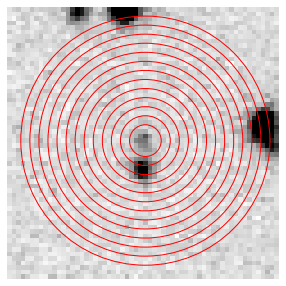

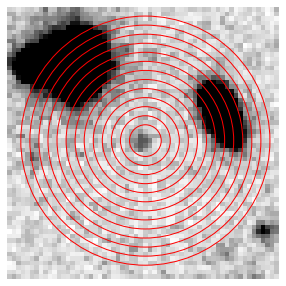

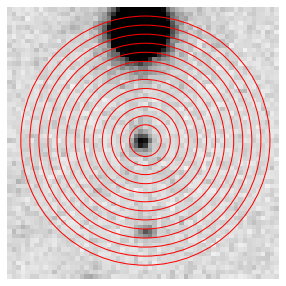

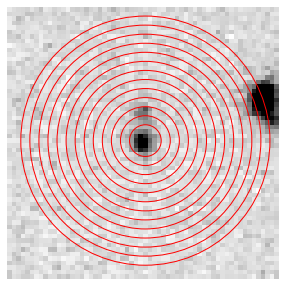

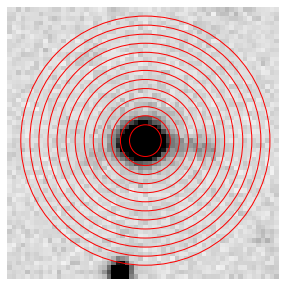

...

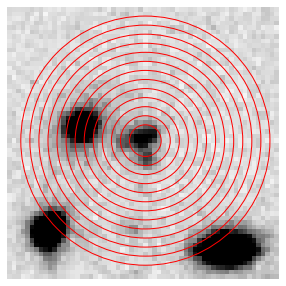

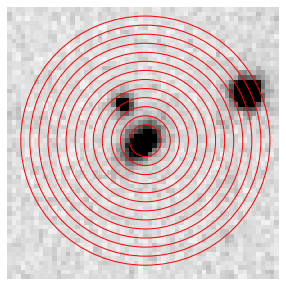

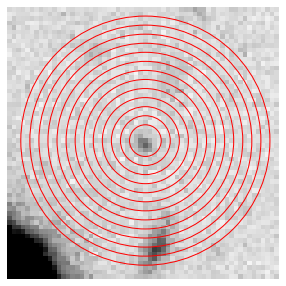

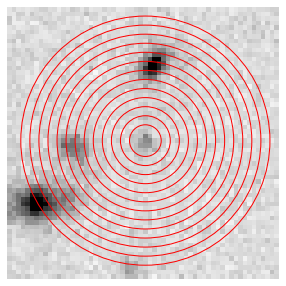

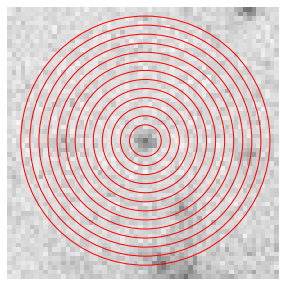

In [8]:
RA_t = aaa['ALPHA_J2000_1'][300:400]
DEC_t = aaa['DELTA_J2000_1'][300:400]

radius = [3.5,5.5,7.5,9.5,11.5,13.5,15.5,17.5,19.5,21.5,23.5,25.5,27.5]

m_wcs = WCS(hdr_NB)
for i in range(len(RA_t)):
    c = SkyCoord(RA_t[i], DEC_t[i], frame=FK5, unit="deg")
       #print(c)
    recorte = Cutout2D(data_NB, c, (60, 60), wcs=m_wcs)
    im = (recorte.data)

    fig, axes = plt.subplots(1, 1, figsize=(5, 5))
    axes.imshow(im, origin='lower', interpolation='nearest',
                  cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)
    for n, radi in enumerate(radius):
        cc =plt.Circle(((len(recorte.data)/2),(len(recorte.data)/2)), radius=radi, fill = False, color = 'r')
        axes.add_artist( cc )
        
#     plt.plot(xs, recorte.data[39]/10)
#     plt.title(str(i))
    plt.axis('off')

In [9]:
ga = Table.read('crossmatch_gaia.fits')  # el error es 1 arcsec
ga

NUMBER,FLUX_ISO,FLUXERR_ISO,MAG_ISO,MAGERR_ISO,FLUX_APER [13],FLUXERR_APER [13],MAGERR_APER [13],MAG_APER [13],FLUX_AUTO,FLUXERR_AUTO,MAG_AUTO,MAGERR_AUTO,BACKGROUND,ALPHAPEAK_J2000,DELTAPEAK_J2000,X_IMAGE,Y_IMAGE,ALPHA_J2000,DELTA_J2000,FLAGS,ELONGATION,ELLIPTICITY,CLASS_STAR,FLUX_RADIUS,SNR_WIN,MAG_APER_g [13],FLUX_APER_g [13],FLUXERR_APER_g [13],MAGERR_APER_g [13],MAGERR_AUTO_g,BACKGROUND_g,MAG_AUTO_g,MAG_APER_r [13],FLUX_APER_r [13],FLUXERR_APER_r [13],MAGERR_APER_r [13],MAGERR_AUTO_r,BACKGROUND_r,MAG_AUTO_r,MAG_APER_i [13],FLUX_APER_i [13],FLUXERR_APER_i [13],MAGERR_APER_i [13],MAGERR_AUTO_i,BACKGROUND_i,MAG_AUTO_i,MAG_APER_z [13],FLUX_APER_z [13],FLUXERR_APER_z [13],MAGERR_APER_z [13],MAGERR_AUTO_z,BACKGROUND_z,MAG_AUTO_z,MAG_APER_y [13],FLUX_APER_y [13],FLUXERR_APER_y [13],MAGERR_APER_y [13],MAGERR_AUTO_y,BACKGROUND_y,MAG_AUTO_y,source_id,ra,dec,parallax,pmra,pmdec,ruwe,phot_g_mean_mag,bp_rp,radial_velocity,phot_variable_flag,non_single_star,has_xp_continuous,has_xp_sampled,has_rvs,has_epoch_photometry,has_epoch_rv,has_mcmc_gspphot,has_mcmc_msc,teff_gspphot,logg_gspphot,mh_gspphot,distance_gspphot,azero_gspphot,ag_gspphot,ebpminrp_gspphot,Separation
,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,deg,deg,mas,mas / yr,mas / yr,,mag,mag,km / s,,,,,,,,,,K,log(cm.s**-2),'dex',pc,mag,mag,mag,arcsec
int32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float64,float64,float32,float32,float64,float64,int16,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,float32,int64,float64,float64,float64,float64,float64,float32,float32,float32,float32,bytes13,int16,bool,bool,bool,bool,bool,bool,bool,float32,float32,float32,float32,float32,float32,float32,float64
217517,377.6322,1.9127883,20.557327,0.0055008233,134.26152 .. 388.83752,0.44904274 .. 2.689989,0.003632168 .. 0.0075129787,21.68012 .. 20.52558,377.3301,1.9592545,20.558197,0.0056389626,-0.053955942,315.9495955629146,-66.18394608314577,21722.697,13705.251,315.94965270321245,-66.18392763853987,0,1.1219225,0.10867286,0.98114467,1.9343059,379.6835,23.11016 .. 21.294228,35.96962 .. 191.56169,0.17442675 .. 0.9148781,0.0052663176 .. 0.0051866192,0.004090595,-0.0070360187,21.356796,22.521143 .. 20.838879,61.878906 .. 291.37234,0.15842876 .. 0.8984625,0.0027804892 .. 0.00334874,0.0025912032,-0.012547053,20.89539,22.162394 .. 20.628616,86.10781 .. 353.63348,0.11463982 .. 0.6977767,0.0014458484 .. 0.0021428557,0.0016345194,-0.010981247,20.680511,22.110748 .. 20.562288,90.30276 .. 375.91098,0.15457506 .. 0.9956811,0.0018589522 .. 0.0028765048,0.0021989928,-0.028247003,20.622133,21.970747 .. 20.572784,102.730865 .. 372.29404,0.43994477 .. 2.8775,0.0046507935 .. 0.008393809,0.0062804627,-0.099117756,20.612177,6401146763206619008,315.94962803533946,-66.18391902016342,1.152380852457816,-2.568482583073897,-8.820036352357235,1.0806966,20.826466,1.3108463,--,NOT_AVAILABLE,0,False,False,False,False,False,False,False,--,--,--,--,--,--,--,0.10826012992449875
217591,359.69458,1.7088976,20.610165,0.0051595517,140.88634 .. 371.617,0.44935536 .. 2.6587584,0.0034637845 .. 0.007769859,21.627829 .. 20.57476,361.60666,1.7789148,20.604408,0.0053425496,-0.054537643,315.9551915271035,-66.18338427580126,21693.049,13712.868,315.95518218706906,-66.18339409245769,0,1.0611795,0.057652295,0.9799611,1.834562,387.0994,23.492935 .. 21.786976,25.282862 .. 121.67735,0.16425157 .. 0.8985493,0.0070552616 .. 0.008019771,0.0058408743,-0.0042964634,21.857786,22.645033 .. 21.047129,55.20606 .. 240.51833,0.15568982 .. 0.8822284,0.0030626918 .. 0.00398348,0.0028985376,-0.0065423483,21.12216,22.201458 .. 20.73787,83.064804 .. 319.78067,0.11312128 .. 0.68446785,0.0014789623 .. 0.0023245062,0.0016420202,-0.0

In [10]:
fits.open('crossmatch_gaia.fits')[0].header

SIMPLE  =                    T / Standard FITS format                           
BITPIX  =                    8 / Character data                                 
NAXIS   =                    1 / Text string                                    
NAXIS1  =                11849 / Number of characters                           
VOTMETA =                    T / Table metadata in VOTable format               
EXTEND  =                    T / There are standard extensions                  
COMMENT                                                                         
COMMENT The data in this primary HDU consists of bytes which                    
COMMENT comprise a VOTABLE document.                                            
COMMENT The VOTable describes the metadata of the table contained               
COMMENT in the following BINTABLE extension.                                    
COMMENT Such a BINTABLE extension can be used on its own as a perfectly         
COMMENT good table, but the 

## Galaxies & Stars

In [11]:
class_star = 0.95

mask_g = (df['CLASS_STAR'] <= class_star) #galaxias
dfg = df[mask_g]


mask_s = (df['CLASS_STAR'] > class_star)  # estrellas
dfs = df[mask_s]

In [12]:
len(dfg)

450651

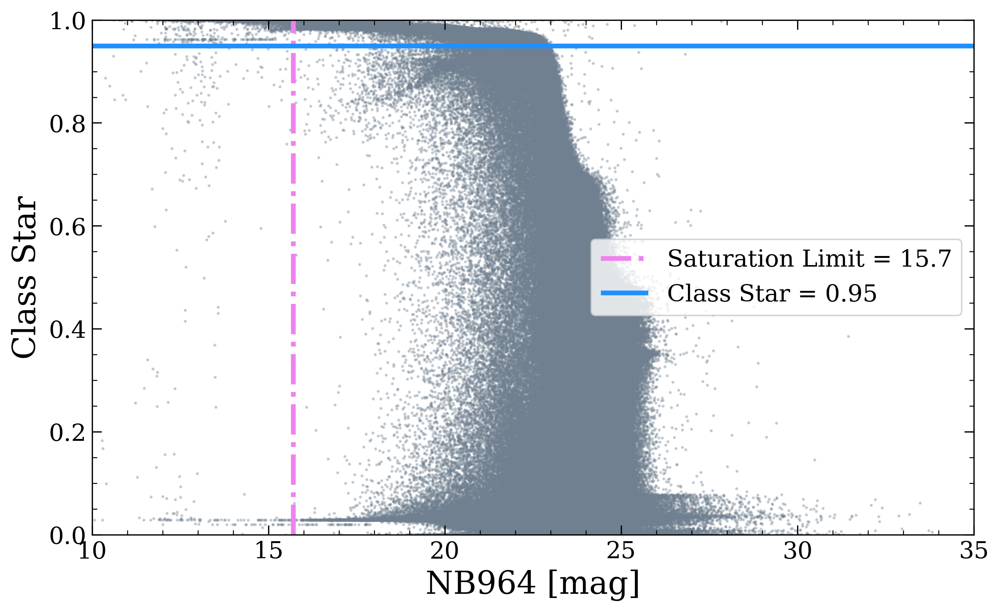

In [13]:
fig, ax = plt.subplots(figsize=(10,6), facecolor= 'w', dpi=300)

plt.scatter(df['MAG_AUTO'], df['CLASS_STAR'], s=1, color = 'slategray', alpha = 0.3)
#plt.scatter(dfg['MAG_AUTO'], dfg['CLASS_STAR'], s=1, color = 'dodgerblue')
#plt.hlines(0.95,0, 30)
plt.xlabel('NB964 [mag]')
plt.ylabel('Class Star')
plt.vlines(15.7, 0, 1.2, linestyle='dashdot', color = 'violet', label = 'Saturation Limit = 15.7', linewidth=3)
plt.hlines(0.95, 10, 35, linestyle='solid', color = 'dodgerblue', label = 'Class Star = 0.95',linewidth=3)
#plt.vlines(11, 0, 1, linestyle='dashed')

ax.xaxis.set_major_locator(ticker.MultipleLocator(5))      # Ticks principales cada 1 unidades en el eje x
ax.xaxis.set_minor_locator(ticker.MultipleLocator(1))    # Ticks secundarios cada 0.1 unidades en el eje x
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.2))      # Ticks principales cada 1 unidades en el eje y
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.05))    # Ticks secundarios cada 0.5 unidades en el eje y
ax.tick_params(axis='x', which='both', bottom=True, top=True, direction='in', length=6)   # Ticks en el eje x en la parte inferior y superior
ax.tick_params(axis='x', which='minor', bottom=True, top=True, direction='in', length=3)
ax.tick_params(axis='y', which='both', left=True, right=True, direction='in', length=6)   # Ticks en el eje y en el lado izquierdo y derecho
ax.tick_params(axis='y', which='minor', bottom=True, top=True, direction='in', length=3)


plt.legend(fontsize=15, markerscale=2, loc = 7)

plt.xlim(10, 35)
plt.ylim(0,1)
#plt.legend(loc = 7)
plt.show()

In [14]:
# %%time

# Objetos con magnitud menor a: 15.7
# mag_mask  = (dfg['MAG_AUTO'] <= 15.7)
# mag_df = dfg[mag_mask]

# RA = mag_df['ALPHA_J2000']
# DEC = mag_df['DELTA_J2000']

#info = pd.read_csv('Fields.txt', sep = " ")


#nsf_id = choosef(RA,DEC,info)
#NSF_cut = cuts(nsf_id, data_NB, hdr_NB, 60, 'NSF' , 'NB')


In [15]:
#enmascaramos

mag_lim = 15.7
masks = (dfs['MAG_AUTO'] >= mag_lim)
n_dfs = dfs[masks]
maskg = (dfg['MAG_AUTO'] >= mag_lim)
n_dfg = dfg[maskg]

In [16]:
len(n_dfg)

450374

In [17]:
# RA_t = dfs['ALPHA_J2000'][0:100]
# DEC_t = dfs['DELTA_J2000'][0:100]

# radius = [3.5,5.5,7.5,11.5,13.5,15.5,17.5,19.5,21.5,23.5,25.5,27.5]

# m_wcs = WCS(hdr_NB)
# for i in range(len(RA_t)):
#     c = SkyCoord(RA_t[i], DEC_t[i], frame=FK5, unit="deg")
#        #print(c)
#     recorte = Cutout2D(data_NB, c, (80, 80), wcs=m_wcs)
#     im = (recorte.data)

#     fig, axes = plt.subplots(1, 1, figsize=(10, 10))
#     axes.imshow(im, origin='lower', interpolation='nearest',
#                   cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)
#     for n, radi in enumerate(radius):
#         cc =plt.Circle(((len(recorte.data)/2),(len(recorte.data)/2)), radius=radi, fill = False, color = 'r')
#         axes.add_artist( cc )
        
#     #plt.plot(xs, recorte.data[39]/10)
#     plt.title(str(i))
#     plt.axis('off')
# plt.rcParams.update({'figure.max_open_warning': 0})

In [18]:
# import astropy.units as u
# from astropy.coordinates import SkyCoord
# from astroquery.gaia import Gaia

# #Gaia.add_votable_fields('otype', 'distance_result')
# c = SkyCoord(RA_t[20], DEC_t[20], frame=FK5, unit="deg")
# width = u.Quantity(0.01, u.deg)
# height = u.Quantity(0.01, u.deg)
# r = Gaia.query_object_async(coordinate=c, width=width, height=height)
# r.pprint(max_lines=12, max_width=130)
# #Simbad.list_votable_fields()
# #result_table

In [19]:
# import astropy.units as u
# from astropy.coordinates import SkyCoord
# from astroquery.gaia import Gaia

# coord = SkyCoord(ra=280, dec=-60, unit=(u.degree, u.degree), frame='icrs')
# width = u.Quantity(0.1, u.deg)
# height = u.Quantity(0.1, u.deg)
# r = Gaia.query_object_async(coordinate=coord, width=width, height=height)
# r.pprint(max_lines=12, max_width=130)

# Aper 6 - Aper 0 (vector)

In [20]:
MAG_z_0g = np.array([n_dfg['MAG_APER'][i][0] for i in range(len(n_dfg))])
MAG_z_6g = np.array([n_dfg['MAG_APER'][i][3] for i in range(len(n_dfg))])

MAG_z_0s = np.array([ga['MAG_APER'][i][0] for i in range(len(ga))])
MAG_z_6s = np.array([ga['MAG_APER'][i][3] for i in range(len(ga))])

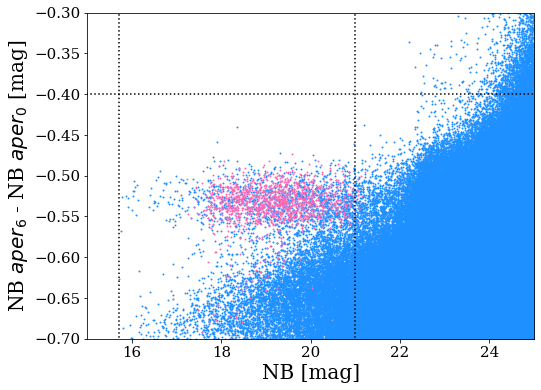

In [21]:
# 6 = -0.82
# 3 = -0.6
# 3 =-0.5

fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')


ax.scatter(n_dfg['MAG_AUTO'], MAG_z_6g-MAG_z_0g, s=0.9, color='dodgerblue')
ax.scatter(ga['MAG_AUTO'], MAG_z_6s-MAG_z_0s, s=0.9, color='hotpink', alpha = 1)
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('NB [mag]')
ax.set_ylabel(r'NB $aper_6$ - NB $aper_0$ [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-0.7,-0.3)
#ax.set_ylabel('Class Star')

ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
ax.hlines(-0.4,9,30,linestyle = 'dotted', color = 'k')
ax.vlines(21,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

In [22]:
#mask apers

aper_diff = MAG_z_6g-MAG_z_0g
mask_aper = (aper_diff >= -0.9) & (n_dfg['MAG_AUTO'] < 22)
aper_cat = n_dfg[mask_aper]

In [23]:
MAG_z_0_ap = np.array([aper_cat['MAG_APER'][i][0] for i in range(len(aper_cat))])
MAG_z_6_ap = np.array([aper_cat['MAG_APER'][i][6] for i in range(len(aper_cat))])

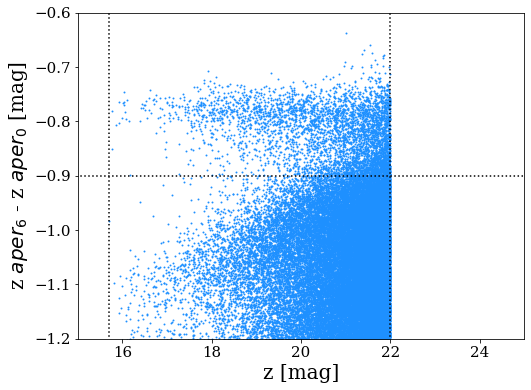

In [24]:
fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')
#ax.scatter(dfs['MAG_AUTO_z_1'], MAG_z_6s-MAG_z_0s, s=1, color='hotpink')
ax.scatter(aper_cat['MAG_AUTO'], MAG_z_6_ap-MAG_z_0_ap, s=0.9, color='dodgerblue')
#ax.set_xlim(16, 25)
ax.set_ylabel(r'z $aper_6$ - z $aper_0$ [mag]')
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('z [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1.2, -0.6)
#ax.set_ylabel('Class Star')

ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
ax.hlines(-0.9,9,30,linestyle = 'dotted', color = 'k')
ax.vlines(22,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

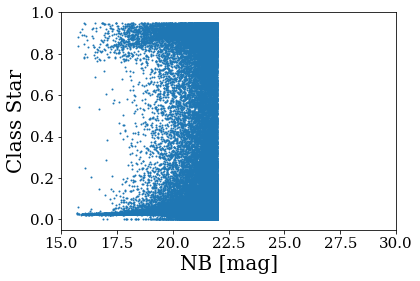

In [25]:
plt.scatter(aper_cat['MAG_AUTO'], aper_cat['CLASS_STAR'], s=1)
#plt.hlines(0.95,0, 30)
plt.xlabel('NB [mag]')
plt.ylabel('Class Star')
# plt.vlines(15.7, 0, 1, linestyle='dashed')
# plt.vlines(17, 0, 1, linestyle='dashed')
plt.xlim(15, 30)
plt.show()

In [26]:
# mask_test = (aper_cat['MAG_AUTO_z_1'] >= 15.7)  & (aper_cat['MAG_AUTO_z_1'] <= 17)
# df_test = aper_cat[mask_test]

In [27]:
len(df)-len(aper_cat)

468092

In [28]:
len(aper_cat)

51347

In [29]:
# RA_ = aper_cat['ALPHA_J2000']
# DEC_ = aper_cat['DELTA_J2000']

# with open('stars.txt','w') as file:
#     for i, ra in enumerate(RA_[0:1000]):
#         file.write(f"{ra} {DEC_[i]}\n")
    

# # test_id = choosef(RA_[0:100],DEC_[0:100],info)
# # test_cut = cuts(test_id, data_NB, hdr_NB, 20, 'NSF' , 'NB')

In [30]:
# from astroquery.simbad import Simbad
# import astropy.coordinates as coord
# import astropy.units as u

# id_s = 6

# c = SkyCoord(RA_[id_s], DEC_[id_s], frame=FK5, unit="deg")
# Simbad.add_votable_fields('otype', 'distance_result')
# result_table = Simbad.query_region(c,
#                                    radius='0d1m0s',
#                                    epoch='J2000',
#                                    equinox=2000)

# result_table

In [31]:
# # good = 6



# m_wcs = WCS(hdr_NB)
# c1 = SkyCoord('21h12m43.3604s', '-66d57m50.970s', frame=FK5)
# #c1 = SkyCoord('21h05m49.0699s', '-66d58m16.582s', frame =FK5)
# recorte1 = Cutout2D(data_NB, c1, (200, 200), wcs=m_wcs)
# im1 = (recorte1.data)

# fig, axes = plt.subplots(1, 1, figsize=(10, 10))
# axes.imshow(im1, origin='lower', interpolation='nearest',
#                   cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)



# c = SkyCoord(RA_[id_s], DEC_[id_s], frame=FK5, unit="deg")
#        #print(c)
# recorte = Cutout2D(data_NB, c, (200, 200), wcs=m_wcs)
# im = (recorte.data)

# fig, axes = plt.subplots(1, 1, figsize=(10, 10))
# axes.imshow(im, origin='lower', interpolation='nearest',
#                   cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)

# #axes.scatter()

In [32]:
# from astroquery.ipac.ned import Ned

# co = SkyCoord(ra=RA_[id_s], dec=DEC_[id_s],
#                           unit=(u.deg, u.deg), frame='fk5')
# result_table_NED = Ned.query_region(c,
#                                 radius='0d6m0s',
#                                 equinox=2000)
# print(result_table_NED)

# Aper 3 - Aper 0

In [33]:
MAG_z_3g = np.array([n_dfg['MAG_APER'][i][3] for i in range(len(n_dfg))])
MAG_z_3s = np.array([n_dfs['MAG_APER'][i][3] for i in range(len(n_dfs))])

In [34]:
MAG_z_3s

array([17.406101, 16.928017, 22.692032, ..., 19.946785, 21.839546,
       19.308363], dtype=float32)

ValueError: operands could not be broadcast together with shapes (67431,) (1328,) 

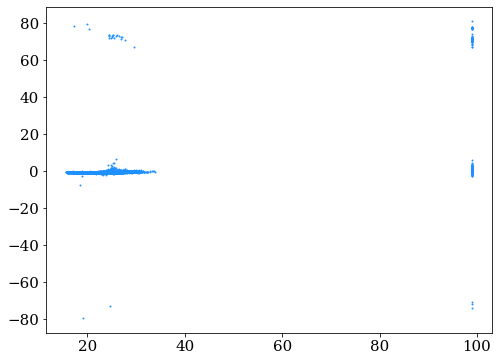

In [35]:
# 6 = -0.82
# 3 = -0.6
# 3 =-0.5

fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')


ax.scatter(n_dfg['MAG_AUTO'], MAG_z_3g-MAG_z_0g, s=0.9, color='dodgerblue')
ax.scatter(n_dfs['MAG_AUTO'], MAG_z_3s-MAG_z_0s, s=0.9, color='hotpink')
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('NB [mag]')
ax.set_ylabel(r'NB $aper_9$ - NB $aper_0$ [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1, -0.2)
#ax.set_ylabel('Class Star')

ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
ax.hlines(-0.6,9,30,linestyle = 'dotted', color = 'k')
ax.vlines(21,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

In [36]:
aper_diff2 = MAG_z_3g-MAG_z_0g
mask_aper2 = (aper_diff2 >= -0.6) & (n_dfg['MAG_AUTO'] < 22)
aper_cat2 = n_dfg[mask_aper2]

In [37]:
len(aper_cat2)

5822

In [38]:
RA_2 = aper_cat2['ALPHA_J2000']
DEC_2 = aper_cat2['DELTA_J2000']

with open('stars2.txt','w') as file:
    for i, ra in enumerate(RA_2[0:1000]):
        file.write(f"{ra} {DEC_2[i]}\n")

In [39]:
# c2 = SkyCoord('21h11m22.02543870038s', '-66d52m34.3783706040s', frame=FK5) #mi coord
# recorte2 = Cutout2D(data_NB, c2, (200, 200), wcs=m_wcs)
# im2 = (recorte2.data)

# fig, axes = plt.subplots(1, 1, figsize=(10, 10))
# axes.imshow(im2, origin='lower', interpolation='nearest',
#                   cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)



# c3 = SkyCoord('21h11m26.5999080648s','-66d52m44.969135880s', frame=FK5) #star 28.95arcsec
#        #print(c)
# recorte3 = Cutout2D(data_NB, c3, (200, 200), wcs=m_wcs)
# im3 = (recorte3.data)

# fig, axes = plt.subplots(1, 1, figsize=(10, 10))
# axes.imshow(im3, origin='lower', interpolation='nearest',
#                   cmap='Greys', vmin=-1*sigmac, vmax=3*sigmac)

In [40]:
MAG_ga_0g = np.array([ga['MAG_APER'][i][0] for i in range(len(ga))])
MAG_ga_6g = np.array([ga['MAG_APER'][i][6] for i in range(len(ga))])

In [41]:
len(MAG_ga_6g)

1328

ValueError: x and y must be the same size

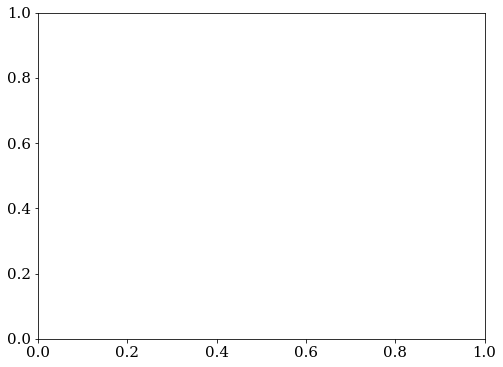

In [42]:
fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')



ax.scatter(n_dfs['MAG_AUTO'], MAG_z_6s-MAG_z_0s, s=0.9, color='hotpink')
ax.scatter(ga['MAG_AUTO'], MAG_ga_6g-MAG_ga_0g, s=0.9, color='dodgerblue')
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('NB [mag]')
ax.set_ylabel(r'NB $aper_6$ - NB $aper_0$ [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1.5,-0)
#ax.set_ylabel('Class Star')

# ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
# ax.hlines(-0.9,9,30,linestyle = 'dotted', color = 'k')
# ax.vlines(22,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

In [ ]:
from itertools import permutations

comb = []
# Get all permutations of length 2
# and length 2
perm = permutations([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], 2)

# Print the obtained permutations
for i in list(perm):
    #print(i)
    if i[1]> i[0]:
        comb.append(i)

In [ ]:
len(comb)

In [43]:
for n in range(len(comb)):
    #"print(comb[0])"
    fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')

    MAG_1_g = np.array([n_dfg['MAG_APER'][i][comb[n][0]] for i in range(len(n_dfg))])
    #print(len(MAG_1_g))
    MAG_2_g = np.array([n_dfg['MAG_APER'][i][comb[n][1]] for i in range(len(n_dfg))])
    
    MAG_ga_1 = np.array([ga['MAG_APER'][i][comb[n][0]] for i in range(len(ga))])
    MAG_ga_2 = np.array([ga['MAG_APER'][i][comb[n][1]] for i in range(len(ga))])

    ax.scatter(n_dfg['MAG_AUTO'], MAG_2_g-MAG_1_g, s=0.9, color='hotpink')
    ax.scatter(ga['MAG_AUTO'], MAG_ga_2-MAG_ga_1, s=0.9, color='dodgerblue')
    # ax.vlines(10,0,1, linestyle = 'dashed')
    # ax.vlines(17.5,0,1,linestyle = 'dashed')
    ax.set_xlabel('NB [mag]')
    ax.set_ylabel(r'NB '+ str(comb[n][1])+'- NB ' +str(comb[n][0])+'[mag]')
    ax.set_xlim(15, 25)
    ax.set_ylim(-2,0)
    #ax.set_ylabel('Class Star')

    # ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
    # ax.hlines(-0.9,9,30,linestyle = 'dotted', color = 'k')
    #ax.vlines(22,-2,1, linestyle = 'dotted', color = 'k')
    plt.show()

NameError: name 'comb' is not defined

In [ ]:
len(aper_cat3)

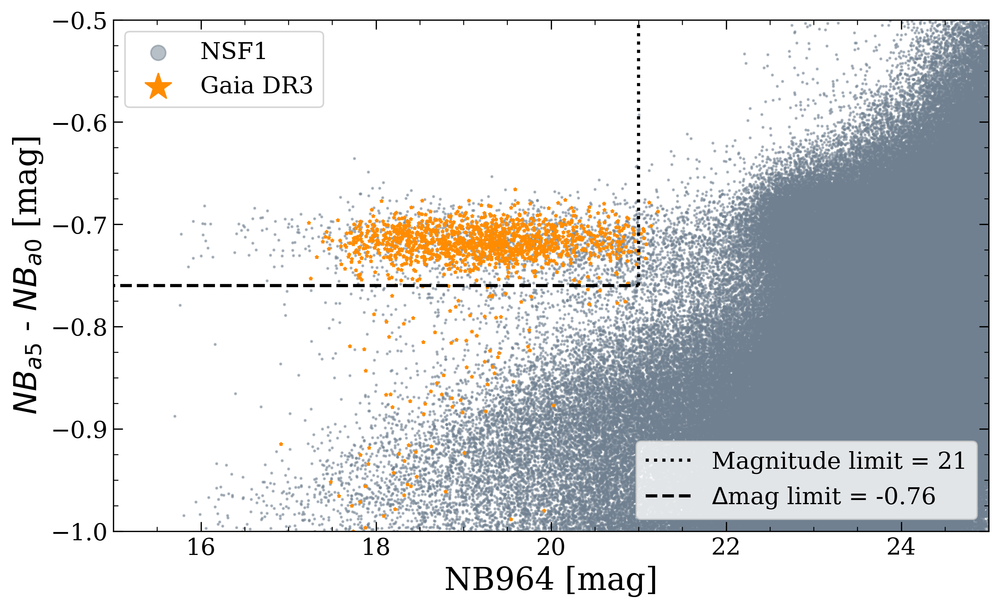

In [49]:
fig, ax = plt.subplots(figsize=(10, 6), dpi = 300)

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')

MAG_1_g = np.array([n_dfg['MAG_APER'][i][0] for i in range(len(n_dfg))])
#print(len(MAG_1_g))
MAG_2_g = np.array([n_dfg['MAG_APER'][i][5] for i in range(len(n_dfg))])

MAG_ga_1 = np.array([ga['MAG_APER'][i][0] for i in range(len(ga))])
MAG_ga_2 = np.array([ga['MAG_APER'][i][5] for i in range(len(ga))])

nsf = ax.scatter(n_dfg['MAG_AUTO'], MAG_2_g-MAG_1_g, s=0.9, color='slategray', label = 'NSF1', alpha = 0.5)
gaia =ax.scatter(ga['MAG_AUTO'], MAG_ga_2-MAG_ga_1, s=3, color='darkorange', label = 'Gaia DR3', marker = '*', alpha = 1)
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('NB964 [mag]')
ax.set_ylabel(r'$NB_{a5}$ - $NB_{a0}$ [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1,-0.5)
#ax.set_ylabel('Class Star')

# ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')

mag = ax.vlines(21,-0.76,1, linestyle = 'dotted', color = 'k', label = 'Magnitude limit = 21', linewidth = 2)
diff = ax.hlines(-0.76,9,21,linestyle = 'dashed',label = r'$\Delta$mag limit = -0.76', color = 'k', linewidth = 2)

ax.xaxis.set_major_locator(ticker.MultipleLocator(2))      # Ticks principales cada 1 unidades en el eje x
ax.xaxis.set_minor_locator(ticker.MultipleLocator(0.5))    # Ticks secundarios cada 0.1 unidades en el eje x
ax.yaxis.set_major_locator(ticker.MultipleLocator(0.1))      # Ticks principales cada 1 unidades en el eje y
ax.yaxis.set_minor_locator(ticker.MultipleLocator(0.025))    # Ticks secundarios cada 0.5 unidades en el eje y
ax.tick_params(axis='x', which='both', bottom=True, top=True, direction='in', length=6)   # Ticks en el eje x en la parte inferior y superior
ax.tick_params(axis='x', which='minor', bottom=True, top=True, direction='in', length=3)
ax.tick_params(axis='y', which='both', left=True, right=True, direction='in', length=6)   # Ticks en el eje y en el lado izquierdo y derecho
ax.tick_params(axis='y', which='minor', bottom=True, top=True, direction='in', length=3)

first_legend = plt.legend(handles=[nsf,gaia], loc='upper left', markerscale = 10)

plt.gca().add_artist(first_legend)
plt.legend(handles=[mag, diff], loc='lower right')

#plt.legend(fontsize=15, markerscale=2, loc = 2)
plt.show()

In [ ]:
MAG_1_g = np.array([n_dfg['MAG_APER'][i][0] for i in range(len(n_dfg))])
    #print(len(MAG_1_g))
MAG_2_g = np.array([n_dfg['MAG_APER'][i][5] for i in range(len(n_dfg))])

aper_diff3 = MAG_2_g-MAG_1_g
mask_aper3 = (aper_diff3 >= -0.76) & (n_dfg['MAG_AUTO'] < 21)
aper_cat3 = n_dfg[mask_aper3]

In [ ]:
len(aper_cat3)

In [ ]:
MAG_0 = np.array([aper_cat3['MAG_APER'][i][0] for i in range(len(aper_cat3))])
MAG_5 = np.array([aper_cat3['MAG_APER'][i][5] for i in range(len(aper_cat3))])

In [ ]:
fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')
#ax.scatter(dfs['MAG_AUTO_z_1'], MAG_z_6s-MAG_z_0s, s=1, color='hotpink')
ax.scatter(aper_cat3['MAG_AUTO'], MAG_5-MAG_0, s=0.9, color='dodgerblue')
#ax.set_xlim(16, 25)
ax.set_ylabel(r'NB $aper_5$ - NB $aper_0$ [mag]')
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('z [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1, -0.5)
#ax.set_ylabel('Class Star')

ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
ax.hlines(-0.76,9,30,linestyle = 'dotted', color = 'k')
ax.vlines(21,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

In [ ]:
mask_aper3 = (aper_diff3 >= -0.76) & (n_dfg['MAG_AUTO'] < 21)
aper_cat4 = n_dfg[~mask_aper3]

In [ ]:
len(aper_cat4)

In [ ]:
MAG_0b = np.array([aper_cat4['MAG_APER'][i][0] for i in range(len(aper_cat4))])
MAG_5b = np.array([aper_cat4['MAG_APER'][i][5] for i in range(len(aper_cat4))])

fig, ax = plt.subplots(figsize=(8, 6))

#ax.scatter(mag_z, dfs['CLASS_STAR'], s=5, color = 'dodgerblue')
#ax.scatter(dfs['MAG_AUTO_z_1'], MAG_z_6s-MAG_z_0s, s=1, color='hotpink')
ax.scatter(aper_cat4['MAG_AUTO'], MAG_5b-MAG_0b, s=0.9, color='hotpink')
#ax.set_xlim(16, 25)
ax.set_ylabel(r'NB $aper_5$ - NB $aper_0$ [mag]')
# ax.vlines(10,0,1, linestyle = 'dashed')
# ax.vlines(17.5,0,1,linestyle = 'dashed')
ax.set_xlabel('NB [mag]')
ax.set_xlim(15, 25)
ax.set_ylim(-1, -0.5)
#ax.set_ylabel('Class Star')

ax.vlines(15.7,-2,1, linestyle = 'dotted', color = 'k')
ax.hlines(-0.76,9,30,linestyle = 'dotted', color = 'k')
ax.vlines(21,-2,1, linestyle = 'dotted', color = 'k')
plt.show()

In [ ]:
aper_cat4.write('NSF_catalog.fits', format='fits') #cat sin estrellas